**Outline**
1. [Text preparation](#Text_preparation)
2. [Text feature generation](#Text_feature_generation)
3. [Topic modeling & profiling](#Topic_modeling_profiling)
4. [Model building & evaluation](#Model_building_evaluation)

<b>Libraries installed</b>
<br>- pip install textblob
<br>- conda install -c anaconda gensim
<br>- conda install -c conda-forge pyldavis
<br>- pip install -U pip setuptools wheel
<br>- pip install -U spacy
<br>- python -m spacy download en_core_web_sm
<br>- pip install bertopic
<br>- pip install vaderSentiment
<br>- pip install wordcloud

In [1]:
# importing all the required libraries
import pandas as pd
import numpy as np

# text analysis
import re
import string
import spacy
import collections
from collections import Counter
import sys
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns

import nltk
from nltk.tokenize import word_tokenize
from nltk import pos_tag
nltk.download('punkt')
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem import SnowballStemmer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

import gensim.corpora as corpora
from gensim import models
from gensim.utils import simple_preprocess
from gensim.models.coherencemodel import CoherenceModel

import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import os

from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from umap import UMAP

# text classification
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
#from sklearn.linear_model import LinearRegression

#from sklearn.cluster import KMeans
#from sklearn.cluster import AgglomerativeClustering
#from sklearn.metrics import silhouette_score
#from sklearn.decomposition import PCA

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
#from sklearn.ensemble import RandomForestClassifier
#from sklearn.neural_network import MLPRegressor, MLPClassifier
#from sklearn.neighbors import KNeighborsClassifier
#from sklearn.datasets import load_iris
from sklearn.naive_bayes import GaussianNB
#from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, auc

import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package punkt to /Users/jenniet./nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jenniet./nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/Users/jenniet./opt/anaconda3/lib/python3.9/site-packages/xarray/core/pycompat.py:22: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  duck_array_version = LooseVersion(duck_array_module.__version__)
/Users/jenniet./opt/anaconda3/lib/python3.9/site-packages/xarray/core/pycompat.py:37: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  duck_array_version = LooseVersion("0.0.0")
/Users/jenniet./opt/anaconda3/lib/python3.9/site-packages/xarray/core/pycompat.py:37: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  duck_array_version = LooseVersion("0.0.0")
/Users/jenniet./opt/anaconda3/lib/python

In [2]:
# your work should only start with the following code
df=pd.read_csv("A2_Data.csv")

<a id='Text_preparation'></a>
# Text preparation

In the step performed to reduce noise of the text data:
- I have replaced censored patient names which were represented with underscores.
- Some stop words that are common in healthcare context were also identified and extended to stop word list to further filter out the noise from key words.
- Processed texts are passed through a loop to lemmatize each word to its root form using spacy's english NLP model.

Data pre-processing

In [3]:
# drop index columns
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

# drop null values
df1 = df.dropna()
df1 = df1.reset_index(drop=True)

In [4]:
# including only necessary attributes
df2 = df1[['Patient_ID','Clinician_Note']]
df2.rename(columns={"Patient_ID":"ID","Clinician_Note":"Note"}, inplace=True)

In [5]:
# remove duplicated rows
df2.drop_duplicates(keep=False)

# tokenising
df3 = df2['Note'].apply(word_tokenize)

# case folding
df4 = df3.apply(lambda x: [word.lower() for word in x])

# stopwords removal
stop_words = stopwords.words('English')
stop_words.extend(["admission", "also", "daily", "day", "despite", "discharge", "given", "hi", "home", "however", "likely", "mg", "mr", "mr.", "ms", "ms.", "old", "patient", "please", "po", "prior", "slightly", "though", "time", "to", "upon", "well", "with", "without", "who", "year", "years", "x", "p", "mg"])
df5 = df4.apply(lambda x: [word for word in x if word not in stop_words])

# convert list to string
df6 = df5.apply(lambda x:" ".join(x))

# reduce noise
df6.replace({r'[^\w\s]+': ''}, regex=True, inplace =True)
df6 = df6.str.replace('___', '')
df6 = df6.str.replace('  ', ' ')

# remove duplicated rows
df6 = df6.drop_duplicates(keep=False)

# enriching data
df_enriched = df1
df_enriched["Processed_Note"] = df6

# drop null values
df_enriched = df_enriched.dropna()
df_enriched = df_enriched.reset_index(drop=True)

In [6]:
nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])

lemma_text_list = []
for sentence in nlp.pipe(df_enriched["Processed_Note"]):
    lemma_text_list.append(" ".join(token.lemma_ for token in sentence))
df_enriched["Lemma_Note"] = lemma_text_list

In [8]:
# tokenization of cleaned texts for topic modelling
df7 = df_enriched["Lemma_Note"].apply(word_tokenize)

<a id='Text_feature_generation'></a>
# Text feature generation

Key features generated include:
- Vectors obtained from TFIDF vectorizer with parameters set to ignore terms with document frequency of higher than 80% and terms that have lower than 5 occurrence threshold.
- Projection method to dimensionality reduction through SVD using TFIDF vectors to condense our large unstructured text data into few input variables*.
- Sentiment score* for each note through sentiment analyzer.
- Topic probability distribution* obtained through trained LDA model from gensim using doc2bow() function.
<br>
<br>*Added to df_enriched for model fitting in supervised text classification.

### TF-IDF

In [9]:
vectorizer = TfidfVectorizer(max_df = 0.8,
                            min_df = 5,
                            stop_words = "english")
TFIDF = vectorizer.fit_transform(df_enriched["Lemma_Note"])

In [10]:
feature_names = vectorizer.get_feature_names_out()

### SVD

In [11]:
My_SVD = TruncatedSVD(n_components=3, n_iter=100)
SVD_Note = My_SVD.fit_transform(TFIDF)

df_enriched[["SVD1", "SVD2", "SVD3"]] = SVD_Note

In [20]:
sentiment_analyzer = SentimentIntensityAnalyzer()

sentimental_text_list = []

for sentence in df_enriched["Lemma_Note"]:
    text_score = sentiment_analyzer.polarity_scores(sentence)['compound']
    sentimental_text_list.append(text_score)
    
df_enriched["Senti_Score"] = sentimental_text_list

## Topic vectors

### Latent Dirichlet Allocation

In [12]:
# map words and integer ids
My_id2word = corpora.Dictionary(df7)

# convert document into bag-of-words format
My_Corpus = [My_id2word.doc2bow(text) for text in df7]

# build LDA model
My_LDA = models.LdaMulticore(corpus=My_Corpus, id2word=My_id2word, num_topics=3)

In [13]:
My_LDA.print_topics()

[(0,
  '0.010*"continue" + 0.009*"pain" + 0.006*"s" + 0.005*"follow" + 0.005*"stable" + 0.005*"start" + 0.004*"course" + 0.004*"mg" + 0.004*"medication" + 0.004*"tolerate"'),
 (1,
  '0.008*"pain" + 0.008*"continue" + 0.007*"mg" + 0.005*"start" + 0.005*"outpatient" + 0.005*"follow" + 0.005*"stable" + 0.004*"medication" + 0.004*"issue" + 0.004*"present"'),
 (2,
  '0.007*"follow" + 0.007*"pain" + 0.006*"continue" + 0.005*"mg" + 0.005*"start" + 0.005*"stable" + 0.005*"medication" + 0.005*"discharge" + 0.005*"outpatient" + 0.005*"issue"')]

In [14]:
# compute coherence score
cm = CoherenceModel(model=My_LDA, corpus=My_Corpus, coherence='u_mass')

# get coherence value
coherence = cm.get_coherence()

print(coherence)

-0.7727479639404565


In [15]:
# generate probability for each topic
topic_proba = My_LDA.get_document_topics(bow=My_Corpus)

# view gensim LDA distributions
list(topic_proba)[0:5]

[[(0, 0.056554865), (1, 0.9047601), (2, 0.03868502)],
 [(0, 0.09735726), (1, 0.90028185)],
 [(0, 0.9915605)],
 [(1, 0.47807083), (2, 0.5209685)],
 [(1, 0.9748307), (2, 0.020847373)]]

In [16]:
number_of_topics = 3

overall_topic_vectors = []

for element in topic_proba:
    document_topic_vector = [0]*number_of_topics
    for TOUPLE in element:
        document_topic_vector[TOUPLE[0]] = TOUPLE[1]
    overall_topic_vectors.append(document_topic_vector)

In [17]:
# add text feature generated - topic probabilities to df
df_enriched[["Topic1", "Topic2", "Topic3"]] = overall_topic_vectors

In [18]:
# generate new column and assign value for most probable topic
most_probable_topic_list = []
probability_min = 0.5

for p in overall_topic_vectors:
    
    current_best_probs = []
    
    for j in p:
        if j >= probability_min:
                current_best_probs.append(j)
            
    if len(current_best_probs) > 0:
            most_probable_topic_list.append(p.index(max(current_best_probs))+1)
            
    else:
            most_probable_topic_list.append(-1)

df_enriched["Topic_No"] = most_probable_topic_list

In [51]:
# split data based on topic no
df_topicNA = df_enriched[df_enriched["Topic_No"] == -1]
df_topic1 = df_enriched[df_enriched["Topic_No"] == 1]
df_topic2 = df_enriched[df_enriched["Topic_No"] == 2]
df_topic3 = df_enriched[df_enriched["Topic_No"] == 3]

print("Instances in topic NA: ", len(df_topicNA["Lemma_Note"]))
print("Instances in topic 1: ", len(df_topic1["Lemma_Note"]))
print("Instances in topic 2: ", len(df_topic2["Lemma_Note"]))
print("Instances in topic 3: ", len(df_topic3["Lemma_Note"]))

Instances in topic NA:  2324
Instances in topic 1:  15129
Instances in topic 2:  16237
Instances in topic 3:  8555


### Sentiment analysis

<AxesSubplot:title={'center':'Average sentiment score by topic no.'}, xlabel='Topic No.', ylabel='Avg sentiment score'>

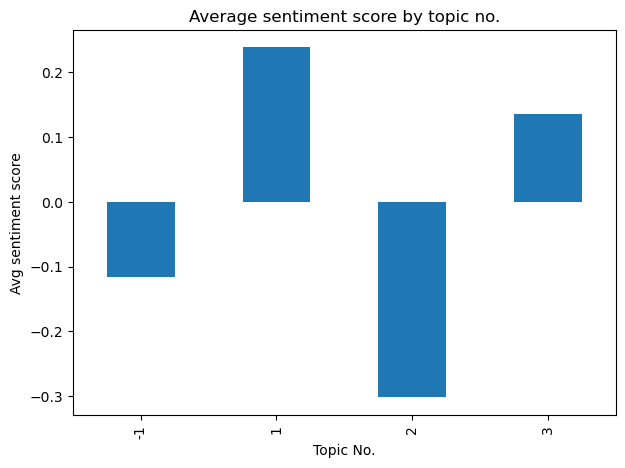

In [21]:
# plot average sentiment score
# run this after topic number generation
dfs = df_enriched.groupby(['Topic_No'])['Senti_Score'].mean()

dfs.plot(kind='bar', 
         title='Average sentiment score by topic no.',
        ylabel='Avg sentiment score',
        xlabel='Topic No.',
        figsize=(7,5))

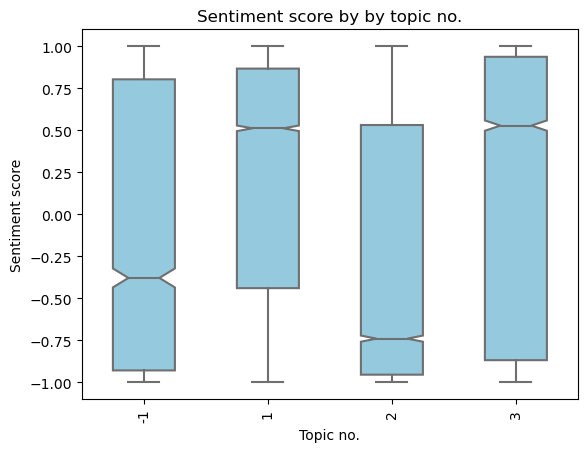

In [22]:
# create seaborn boxplots by group
sns.boxplot(x='Topic_No', y='Senti_Score', width=0.5, notch = True, color='skyblue',
            data=df_enriched, showfliers=False).set(title='Sentiment score by by topic no.')

# add stripplot
#sns.stripplot(x='Topic_No', y='Senti_Score', data=df_enriched, color="blue", jitter=0.2, size=2)

# modify axis labels
plt.xlabel('Topic no.')
plt.ylabel('Sentiment score')
plt.xticks(rotation=90)

plt.show()

<a id='Topic_modeling_profiling'></a>
# Topic modeling & profiling

### Model used: BERTopic
BERTopic provides continuous topic modeling and using BERT topic model I have extracted a list of topics starting from the most important one. BERTopic's embedding model also provides me with easier and interactive process for topic inspection.
<br>Using similarity matrix, I will also perform a comparison analysis.

##### Topic 1 theme - Coronary artery disease
Patients' cases that fall under this topic typically underwent chest bypass and grafting surgery. They follow prescriptions like taking medication for pain control to discontinue their complications. This topic has a similarity score of 0.85 to topic 6 due to these overlapping key words: chest pain, cardiac, medication.

Unique frequent words in topic 1
- coronery artery bypass
- chest pain
- medication
- follow
- healing pain control

##### Topic 2 theme - Digestive issues
Patients' cases that fall under this topic typically experience abdominal pain due to cholelithiasis stemming from digestive fluid issues. Hence the most common treatment they follow relates to having a regular diet with continued monitoring to control their fluid balance. This topic has a similarity score of 0.85 to topic 6 due to these overlapping key words: pain, continue, issue.

Unique frequent words in topic 2
- abdominal pain
- cholelithiasis
- diet issue
- operating room
- acute

##### Topic 3 theme - Mental health
Patients' cases that fall under this topic struggle with mental illness to the extent of them experiencing chronic pain, insomnia, anxiety, and hallucinations. They are treated using mindbody techniques and underwent muscle relaxation practice. This topic has a similarity score of 0.79 to topic 1 due to these overlapping key words: outpatient, pain, transfer.

Unique frequent words in topic 3
- anxiety
- chronic pain
- psychiatric
- disorder
- relaxation

### Topic visualization (LDA)

In [23]:
pyLDAvis.enable_notebook()

number_of_topics = 3
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+str(number_of_topics))

gensimvis.prepare(My_LDA, My_Corpus, My_id2word)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.005665 -0.001445       1        1  44.530667
0     -0.004452 -0.003067       2        1  28.407411
2     -0.001213  0.004511       3        1  27.061922, topic_info=         Term          Freq         Total Category  logprob  loglift
201    follow  51167.000000  51167.000000  Default  30.0000  30.0000
79   continue  74321.000000  74321.000000  Default  29.0000  29.0000
635     chest  19338.000000  19338.000000  Default  28.0000  28.0000
147         s  38146.000000  38146.000000  Default  27.0000  27.0000
8        diet  24732.000000  24732.000000  Default  26.0000  26.0000
..        ...           ...           ...      ...      ...      ...
383      need   7387.476875  26996.188926   Topic3  -5.8352   0.0111
42       show   7903.858163  36214.237186   Topic3  -5.7676  -0.2151
182   concern   7410.187848  29177.602703   Topic3  -5.8321  -0.0635
89        due   7280.955857  27528.544988   Topic3  -5.8497  -0.0229
250         1   7198.310371  27463.165883   Topic3  -5.8611  -0.0320

[325 rows x 6 columns], token_table=       Topic      Freq   Term
term                         
250        1  0.437349      1
250        2  0.300512      1
250        3  0.262097      1
254        1  0.427930      2
254        2  0.288917      2
...      ...       ...    ...
27990      1  0.441011  wksht
27990      2  0.441011  wksht
459        1  0.444982    yes
459        2  0.156590    yes
459        3  0.398454    yes

[660 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 3])

### Exploratory data analysis with WordCloud

In [24]:
# fine tuning text
stop_words.extend(['mg', 'x', 'ye', 'yes', 'note', 'noted', 'though', 'currently', 'continue', 'status', 'due', 'sp', 'start'])
                         

My_WordCloud = WordCloud(background_color="white",
                         stopwords=stop_words,
                         max_words=50)

Topic 1 WordCloud

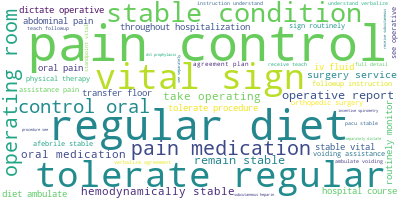

In [25]:
My_LongString1 = ','.join(list(df_topic1["Lemma_Note"].values))
My_WordCloud.generate(My_LongString1)
My_WordCloud.to_image()

In [26]:
Split_Str1 = My_LongString1.split()
Counters_found1 = Counter(Split_Str1)

T1_common = Counters_found1.most_common(15)
print(T1_common)

[('pain', 34244), ('stable', 24457), ('tolerate', 21907), ('diet', 20385), ('control', 17254), ('s', 14659), ('medication', 14055), ('continue', 13088), ('iv', 12996), ('oral', 12355), ('follow', 12251), ('remain', 12241), ('receive', 12138), ('surgery', 11962), ('course', 11961)]


Topic 2 WordCloud

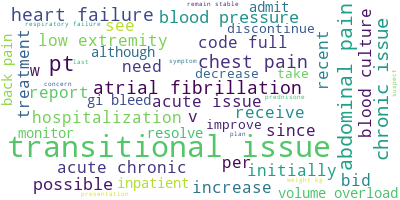

In [27]:
My_LongString2 = ','.join(list(df_topic2["Lemma_Note"].values))
My_WordCloud.generate(My_LongString2)
My_WordCloud.to_image()

In [28]:
Split_Str2 = My_LongString2.split()
Counters_found1 = Counter(Split_Str2)

T2_common = Counters_found1.most_common(15)
print(T2_common)

[('continue', 43168), ('mg', 29133), ('pain', 28113), ('outpatient', 25660), ('issue', 24468), ('follow', 24364), ('start', 22588), ('present', 20627), ('acute', 19993), ('history', 18935), ('chronic', 18466), ('show', 18379), ('negative', 17698), ('set', 16965), ('concern', 15540)]


Topic 3 WordCloud

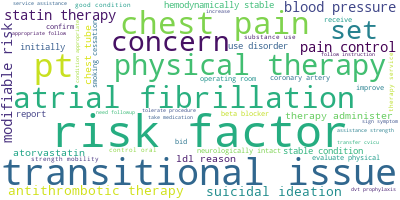

In [29]:
My_LongString3 = ','.join(list(df_topic3["Lemma_Note"].values))
My_WordCloud.generate(My_LongString3)
My_WordCloud.to_image()

In [30]:
Split_Str3 = My_LongString3.split()
Counters_found3 = Counter(Split_Str3)

T3_common = Counters_found3.most_common(15)
print(T3_common)

[('mg', 14830), ('medication', 13191), ('follow', 12161), ('yes', 12129), ('continue', 11558), ('risk', 10860), ('start', 10390), ('therapy', 9707), ('discharge', 9689), ('stroke', 9556), ('s', 8759), ('history', 8750), ('leave', 8543), ('outpatient', 8534), ('pain', 7747)]


### BERTopic

In [31]:
topic_model = BERTopic(embedding_model="all-MiniLM-L6-v2")

In [32]:
# using a sample of only 3000 records from original data set due to limitation on RAM size
df_samples = df_enriched["Lemma_Note"].sample(3000, random_state=42).to_list()

topics, probs = topic_model.fit_transform(df_samples)

topic_model.update_topics(df_samples, n_gram_range=(1, 3)) # change n-grams without refitting model

topic_model.reduce_topics(df_samples, nr_topics=11) # reduce topic

In [33]:
# generate labels and improve readability of topic words
topic_labels = topic_model.generate_topic_labels(nr_words=7, topic_prefix=True, word_length=20, separator=" - ")

topic_model.set_topic_labels(topic_labels)

# find specific topics
#topic_model.find_topics("name of topic", top_n=1)

In [34]:
# retrieve topic info
topic_model.get_topic_info()
# outliers identified as topic -1

,Topic,Count,Name,CustomName
0,-1,820,-1_continue_pain_mg_follow,-1 - continue - pain - mg - follow - outpatien...
1,0,1236,0_pain_continue_medication_follow,0 - pain - continue - medication - follow - mg...
2,1,443,1_yes_stroke_stable_transfer,1 - yes - stroke - stable - transfer - mg - di...
3,2,132,2_chest_pleural_effusion_pain,2 - chest - pleural - effusion - pain - right ...
4,3,113,3_sign_monitor_stable_tolerate,3 - sign - monitor - stable - tolerate - diet ...
5,4,72,4_diet_pain_regular_regular diet,4 - diet - pain - regular - regular diet - tol...
6,5,61,5_continue_copd_exacerbation_mg,5 - continue - copd - exacerbation - mg - acut...
7,6,44,6_gi_anemia_bleed_iron,6 - gi - anemia - bleed - iron - colonoscopy -...
8,7,34,7_postpartum_fetal_delivery_labor,7 - postpartum - fetal - delivery - labor - st...
9,8,30,8_postoperative_spontaneously_pain control_diet,8 - postoperative - spontaneously - pain contr...


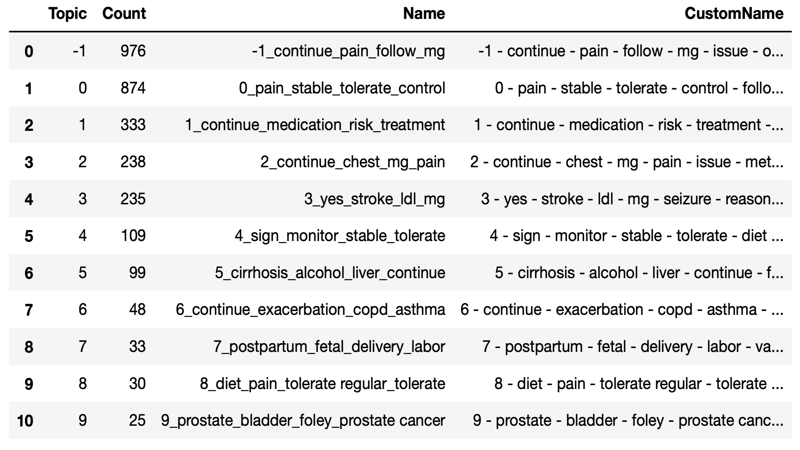

In [35]:
from PIL import Image 
img1 = Image.open('topic_info.png')
img1 = img1.resize((800, 450))
display(img1) 

In [36]:
# create df for bert topic profiling
bert_df = pd.DataFrame({'topic':topics, 'text':df_samples})

# assign top 3 topics to df
bert_df_t1 = bert_df[bert_df['topic']==0]
bert_df_t2 = bert_df[bert_df['topic']==1]
bert_df_t3 = bert_df[bert_df['topic']==2]
bert_df_t4 = bert_df[bert_df['topic']==3]
bert_df_t5 = bert_df[bert_df['topic']==4]
bert_df_t6 = bert_df[bert_df['topic']==5]

# find specific topics
#topic_model.find_topics("chest pain", top_n=1)

# analyse text
#print(bert_df_t1.iloc[3,1])
#print(bert_df_t2.iloc[3,1])
#print(bert_df_t3.iloc[2,1])

### Topic visualization (BERT)

In [37]:
# find words that contribute most to our topics
topic_model.visualize_barchart(width=280, height=300, top_n_topics=8, n_words=10)

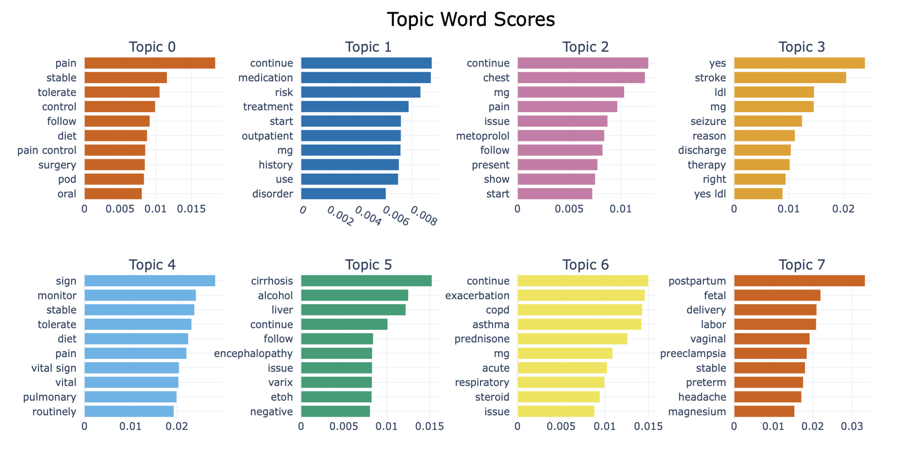

In [38]:
img2 = Image.open('topic_vis.png')
img2 = img2.resize((900, 450))
display(img2)

In [39]:
# heatmap visualization
topic_model.visualize_heatmap(n_clusters=9)

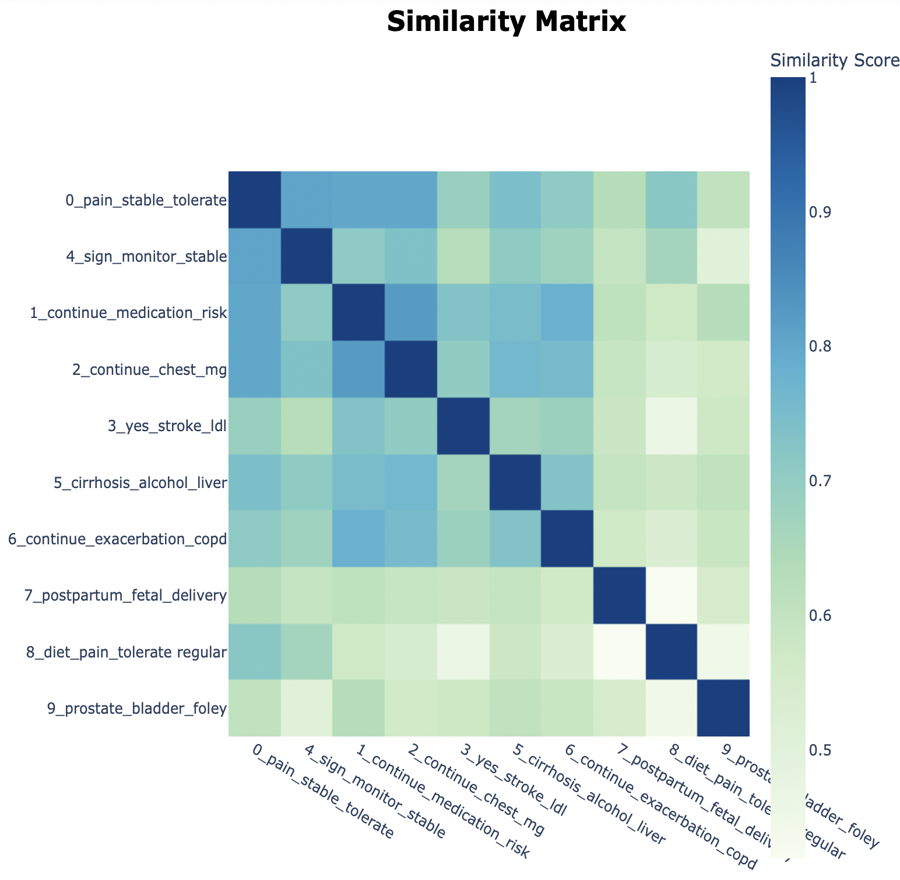

In [40]:
img3 = Image.open('similarity.png')
img3 = img3.resize((900, 880))
display(img3)

In [41]:
sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = sentence_model.encode(df_samples, show_progress_bar=False)

# overview of relationships between documents and topics
topic_model.visualize_documents(df_samples,
                               embeddings=embeddings,
                               topics=list(range(10)),
                               custom_labels=True,
                               height=600)

# select top 3 topics and check distribution

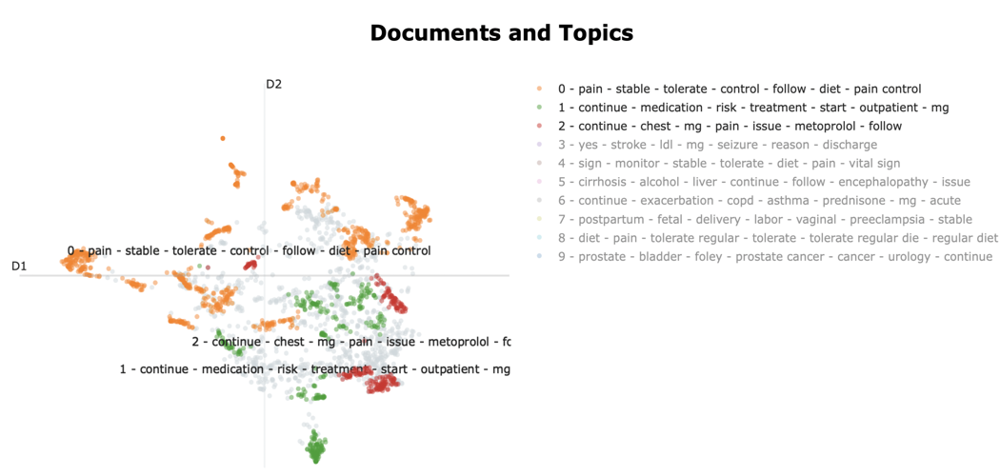

In [42]:
img4 = Image.open('topic_dist.png')
img4 = img4.resize((1050, 500))
display(img4)

<a id='Model_building_evaluation'></a>
# Model building & evaluation

I have split the data into topic 1, topic 2 and topic 3 and performed classification on these data sets separately.
<br>Summary of mean cross validation scores for each topic:

| Topic No. | f1 | Precision | Recall |
| :-: | :-: | :-: | :-: |
| 1 | 0.55386 | 0.60651 | 0.58913 |
| 2 | 0.49135 | 0.43695 | 0.57138 |
| 3 | 0.46223 | 0.43651 | 0.55117 |

Overall, using DT classifier for records that fall under Topic No. 1 seem to perform slightly better than the other topics. Due to the inherent limitations in our data set such as critical info (admission symptoms, operating procedures and follow-up treatment plans) joined together under clinician's note, the unstructured data may still contain a lot of noise even after going through text processing. Along with the high dimensionality behind the data, this may have caused the DT classifier to overfit.

### Data standardisation & attribute selection

In [52]:
#df_topic1 = df_enriched[df_enriched["Topic_No"] == 1]
#df_topic2 = df_enriched[df_enriched["Topic_No"] == 2]
#df_topic3 = df_enriched[df_enriched["Topic_No"] == 3]

print("Instances in topic NA: ", len(df_topicNA["Lemma_Note"]))
print("Instances in topic 1: ", len(df_topic1["Lemma_Note"]))
print("Instances in topic 2: ", len(df_topic2["Lemma_Note"]))
print("Instances in topic 3: ", len(df_topic3["Lemma_Note"]))

Instances in topic NA:  2324
Instances in topic 1:  15129
Instances in topic 2:  16237
Instances in topic 3:  8555


**Topic 1**

In [53]:
# transforming categorical variable
nominal_columns = df_topic1.select_dtypes(include=['object'])
numerical_columns = df_topic1.select_dtypes(exclude=['object'])

le = preprocessing.LabelEncoder()

nominal_converted = nominal_columns.apply(le.fit_transform)

cleaned_t1 = pd.concat([numerical_columns, nominal_converted], axis=1)

In [54]:
# expired cases are labelled as 0 under discharge decision
# drop index rows for expired cases
cleaned_t1_1 = cleaned_t1.drop(cleaned_t1.index[cleaned_t1['Discharge_Decision']==0])

# check for class imbalance
cleaned_t1_1.groupby('Discharge_Decision').describe()

Patient_ID                                           
                        count          mean           std         min   
Discharge_Decision                                                      
1                      2868.0  1.437575e+07  2.496509e+06  10001401.0  \
2                      8161.0  1.432119e+07  2.515753e+06  10001919.0   
3                      3966.0  1.435263e+07  2.516523e+06  10002800.0   

                                                                      
                            25%         50%         75%         max   
Discharge_Decision                                                    
1                   12268129.75  14409869.0  16516512.5  18656782.0  \
2                   12090763.00  14344603.0  16504366.0  18657237.0   
3                   12189114.25  14379068.0  16543388.5  18656157.0   

                   AHRQ Elixhauser score            ... Processed_Note   
                                   count      mean  ...            75%   
Discharge_Decision                                  ...                  
1                                 2868.0  6.487099  ...       12721.25  \
2                                 8161.0  1.361965  ...        9986.00   
3                                 3966.0  4.084216  ...       11343.75   

                            Lemma_Note                                  
                        max      count         mean          std  min   
Discharge_Decision                                                      
1                   15116.0     2868.0  8732.838912  4156.409482  0.0  \
2                   15128.0     8161.0  6840.693542  4394.858977  6.0   
3                   15124.0     3966.0  8194.607665  4183.138949  1.0   

                                                        
                        25%     50%       75%      max  
Discharge_Decision                                      
1                   5174.25  8981.5  12725.25  15121.0  
2                   3003.00  6473.0   9987.00  15127.0  
3                   4685.75  8828.5  11342.50  15124.0  

[3 rows x 184 columns]

In [55]:
# scale df and drop columns unlikely to contribute to prediction model
scaled_t1 = cleaned_t1_1.drop(columns=['Patient_ID',
                                     'Clinician_Note',
                                     'Service',
                                     'Primary_ICD_Code',
                                     'Processed_Note',
                                      'Topic_No'])

scaler = StandardScaler()

scaled_t1[['Gender',
           'Patient_Cause_Of_Pain',
           'Patient_Illness_History',
           'Patient_Family_History',
           'Discharge_Condition',
           'Discharge_Instructions',
           'Lemma_Note']] = scaler.fit_transform(scaled_t1[['Gender',
                                                            'Patient_Cause_Of_Pain',
                                                            'Patient_Illness_History',
                                                            'Patient_Family_History',
                                                            'Discharge_Condition',
                                                            'Discharge_Instructions',
                                                            'Lemma_Note']])

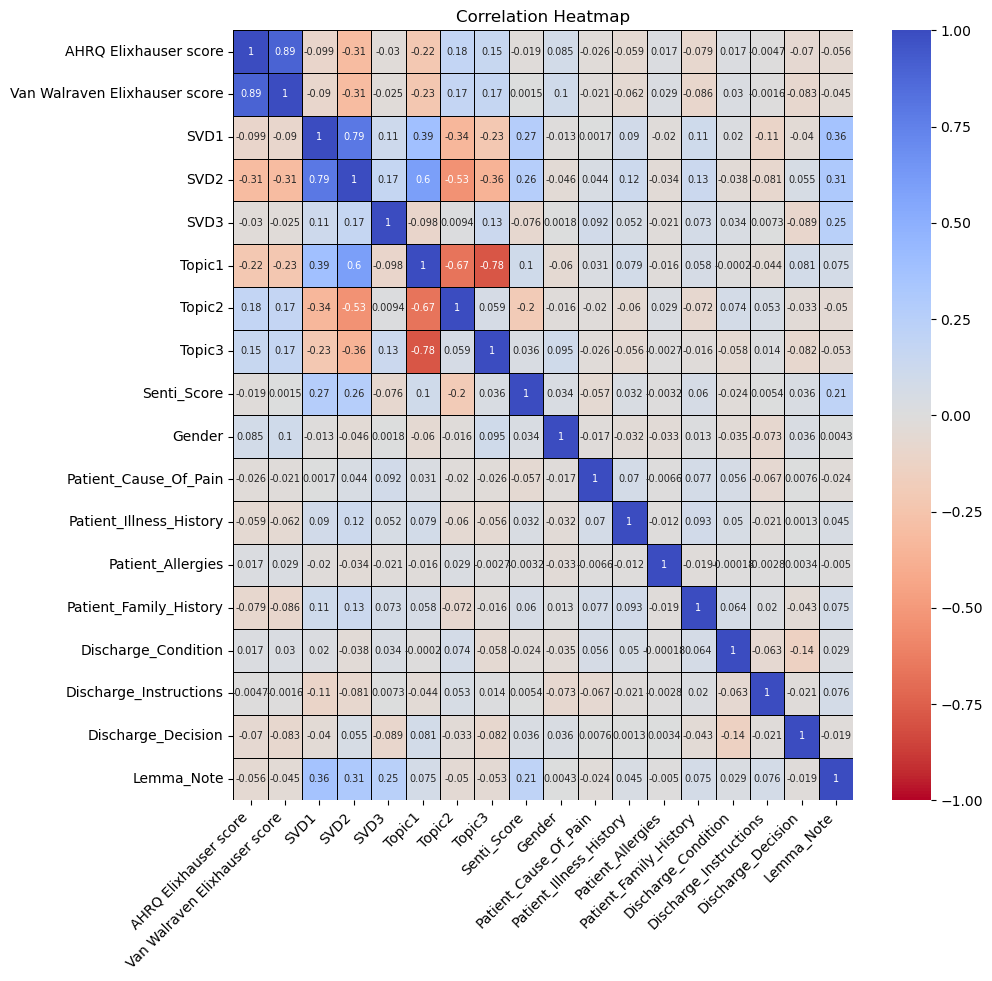

In [56]:
# investigate correlation between variable pairs
# correlation matrix
fig = plt.figure(figsize=(10,10))
sns.heatmap(scaled_t1.corr(), annot = True, fmt='.2g', 
    vmin=-1, vmax=1, center= 0, cmap= 'coolwarm_r', linecolor='black', linewidth=0.5, annot_kws={"size": 7})

# ax.set_ylim(0 ,5)
plt.xticks(rotation=45, ha='right')
plt.title('Correlation Heatmap')
fig.show();

From the heatmap, some qualitative attributes have a negative correlation to discharge decision, hence I will drop:
- Patient family history
- Discharge condition

Similarly, for quantitative attributes I will drop:
- AHRQ Elixhauser score
- Van Walraven Elixhauser score

In [97]:
# create new df for predictive model building and fitting
df_t1 = scaled_t1.drop(columns=['Patient_Family_History',
                                'Discharge_Condition',
                                'AHRQ Elixhauser score',
                                'Van Walraven Elixhauser score'])

In [98]:
# define X and y
X = df_t1.drop(columns=['Discharge_Decision'])
y = df_t1['Discharge_Decision']

# split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Decision Tree

Model building - Topic 1

In [99]:
# fit decision tree classifier to training data
My_DT = DecisionTreeClassifier(max_depth=3, random_state=42)
My_DT.fit(X_train,y_train)

# create labels for test data
My_DT_pred = My_DT.predict(X_test)
print(My_DT_pred)

[2 1 2 ... 2 2 1]


Model evaluation

In [100]:
# cross val scores
# using weighted scores due to underlying imbalance in our class labels
DT_scores_f1 = cross_val_score(My_DT, X, y, cv=6, scoring='f1_weighted')
Avg_DT_f1_rate = DT_scores_f1.mean()

DT_scores_precision = cross_val_score(My_DT, X, y, cv=6, scoring='precision_weighted')
Avg_DT_prec_rate = DT_scores_precision.mean()

DT_scores_recall = cross_val_score(My_DT, X, y, cv=6, scoring='recall_weighted')
Avg_DT_recall_rate = DT_scores_recall.mean()

print('DT: Average f1 rate: ', Avg_DT_f1_rate)
print('DT: Average precision rate: ', Avg_DT_prec_rate)
print('DT: Average recall rate: ', Avg_DT_recall_rate)

DT: Average f1 rate:  0.5538698907918824
DT: Average precision rate:  0.6065076341229556
DT: Average recall rate:  0.5891301854074963


Text(50.722222222222214, 0.5, 'Actual')

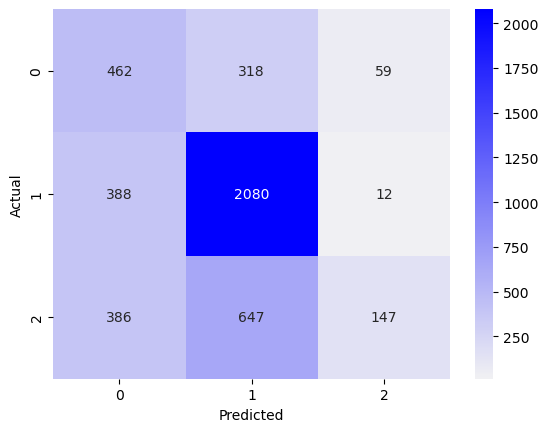

In [102]:
# define confusion matrix
My_DT_cm = confusion_matrix(y_test,My_DT_pred)

# show confusion matrix
sns.heatmap(My_DT_cm, annot=True, fmt='d', cmap=sns.color_palette("light:b", as_cmap=True))
plt.xlabel('Predicted')
plt.ylabel('Actual')